# Importing required libraries

In [ ]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 26.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


In [ ]:
import os
import yaml
import glob
import time
import shutil
import pathlib
import zipfile
import itertools
import kagglehub
from PIL import Image
import xml.etree.ElementTree as ET

import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style('darkgrid')

from sklearn.svm import SVC
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import Sequence
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import regularizers, layers, models
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization, GlobalAveragePooling2D, Input, Reshape

import warnings
warnings.filterwarnings("ignore")

# Constants

In [ ]:
IMG_HEIGHT, IMG_WIDTH = 256, 256
IMG_SIZE = (IMG_HEIGHT, IMG_WIDTH)
EPOCHS = 15
BATCH_SIZE = 32
MIN_AREA  = 500
COLOR_CHANNELS = 3
IMG_SHAPE = (IMG_HEIGHT, IMG_WIDTH, COLOR_CHANNELS)
CLASS_DICT = {'apple': 0, 'banana': 1, 'mixed': 2, 'orange': 3}
NUM_CLASSES = len(CLASS_DICT)

# Loading the dataset

In [ ]:
# from roboflow import Roboflow
# BASE_PATH = kagglehub.dataset_download("siddharthkumarsah/plastic-bottles-image-dataset")
# print("Path to dataset files:", BASE_PATH)

# TRAIN_IMG = os.path.join(BASE_PATH, 'Plastic Bottle Image Dataset', 'train/images')
# TRAIN_LABEL = os.path.join(BASE_PATH, 'Plastic Bottle Image Dataset', 'train/labels')
# VAL_IMG   = os.path.join(BASE_PATH, 'Plastic Bottle Image Dataset', 'valid/images')
# VAL_LABEL = os.path.join(BASE_PATH, 'Plastic Bottle Image Dataset', 'valid/labels')
# TEST_IMG  = os.path.join(BASE_PATH, 'Plastic Bottle Image Dataset', 'test/images')
# TEST_LABEL= os.path.join(BASE_PATH, 'Plastic Bottle Image Dataset', 'test/labels')

# print(TRAIN_IMG)
# print(TRAIN_LABEL)
# print(VAL_IMG)
# print(VAL_LABEL)
# print(TEST_IMG)
# print(TEST_LABEL)

# print(os.path.exists(TRAIN_IMG))

# # Load the classes from data.yaml
# with open(os.path.join(BASE_PATH, 'Custom_data.yaml'), 'r') as file:
#     data_yaml = yaml.safe_load(file)

# # Get class names
# class_names = data_yaml['names']
# num_classes = data_yaml['nc']

# rf = Roboflow(api_key="8HHGdKrPpVFsKvADA7ij")

# # ------ Fruits ------
# project = rf.workspace("fruitsdetection").project("fruits-by-yolo")
# version = project.version(1)

BASE_PATH = kagglehub.dataset_download("mbkinaci/fruit-images-for-object-detection")
print("Path to dataset files:", BASE_PATH)

'''All .xml and .jpg file names'''
TRAIN_PATH = os.path.join(BASE_PATH, 'train_zip', 'train')
TEST_PATH = os.path.join(BASE_PATH, 'test_zip', 'test')

print(os.path.exists(TRAIN_PATH), os.path.exists(TEST_PATH))
print(TRAIN_PATH)
print(TEST_PATH)

# ------ RPS ------
# project = rf.workspace("roboflow-58fyf").project("rock-paper-scissors-sxsw")
# version = project.version(14)

# project = rf.workspace("visionproject-90zmt").project("rock-paper-scissors-smp")
# version = project.version(3)

# dataset = version.download("yolov8-obb")

Path to dataset files: /kaggle/input/fruit-images-for-object-detection
True True
/kaggle/input/fruit-images-for-object-detection/train_zip/train
/kaggle/input/fruit-images-for-object-detection/test_zip/test


## Preprocessing

### To be run in case of YOLO & Generator

In [ ]:
TRAIN_IMG_DIR = 'train/images'
VAL_IMG_DIR = 'val/images'
TEST_IMG_DIR = 'test/images'

TRAIN_LABEL_DIR = 'train/labels'
VAL_LABEL_DIR = 'val/labels'
TEST_LABEL_DIR = 'test/labels'

shutil.rmtree(TRAIN_IMG_DIR)
shutil.rmtree(VAL_IMG_DIR)
shutil.rmtree(TEST_IMG_DIR)
shutil.rmtree(TRAIN_LABEL_DIR)
shutil.rmtree(VAL_LABEL_DIR)
shutil.rmtree(TEST_LABEL_DIR)
os.makedirs(TRAIN_IMG_DIR, exist_ok=True)
os.makedirs(VAL_IMG_DIR, exist_ok=True)
os.makedirs(TEST_IMG_DIR, exist_ok=True)
os.makedirs(TRAIN_LABEL_DIR, exist_ok=True)
os.makedirs(VAL_LABEL_DIR, exist_ok=True)
os.makedirs(TEST_LABEL_DIR, exist_ok=True)

train_images = [f for f in os.listdir(TRAIN_PATH) if f.endswith('.jpg')]
for image in train_images:
    src = os.path.join(TRAIN_PATH, image)
    dst = os.path.join(TRAIN_IMG_DIR, image)
    shutil.copy(src, dst)

train_labels = [f for f in os.listdir(TRAIN_PATH) if f.endswith('.xml')]
for label in train_labels:
    src = os.path.join(TRAIN_PATH, label)
    dst = os.path.join(TRAIN_LABEL_DIR, label)
    shutil.copy(src, dst)

test_labels = [f for f in os.listdir(TEST_PATH) if f.endswith('.xml')]
for label in test_labels:
    src = os.path.join(TEST_PATH, label)
    dst = os.path.join(TEST_LABEL_DIR, label)
    shutil.copy(src, dst)

test_images = [f for f in os.listdir(TEST_PATH) if f.endswith('.jpg')]
for image in test_images:
    src = os.path.join(TEST_PATH, image)
    dst = os.path.join(TEST_IMG_DIR, image)
    shutil.copy(src, dst)

train_images, val_images = train_test_split(train_images, test_size=0.2, random_state=42)

for image in val_images:
    src = os.path.join(TRAIN_IMG_DIR, image)
    dst = os.path.join(VAL_IMG_DIR, image)
    src_label = os.path.join(TRAIN_LABEL_DIR, image.replace('.jpg', '.xml'))
    dst_label = os.path.join(VAL_LABEL_DIR, image.replace('.jpg', '.xml'))
    shutil.move(src, dst)
    shutil.move(src_label, dst_label)

print("Images organized and split into train, validation, and test directories.")

Images organized and split into train, validation, and test directories.


### Run when parsing xml to txt - YOLO

In [ ]:
def parse_xml_to_txt_files(xml_file, class_dict, destination_file):
  try:
      tree = ET.parse(xml_file)
      root = tree.getroot()

      image_width = int(root.find('size/width').text)
      image_height = int(root.find('size/height').text)

      with open(destination_file, 'w') as f:
          for obj in root.findall('object'):
              class_name = obj.find('name').text.strip().lower()
              if class_name not in class_dict:
                  continue

              class_id = class_dict[class_name]

              bbox = obj.find('bndbox')

              xmin = int(bbox.find('xmin').text)
              xmax = int(bbox.find('xmax').text)
              ymin = int(bbox.find('ymin').text)
              ymax = int(bbox.find('ymax').text)

              x_center = (xmin + xmax) / 2 / image_width if image_width != 0 else (xmin + xmax) / 2
              y_center = (ymin + ymax) / 2 / image_height if image_height != 0 else (ymin + ymax) / 2
              width = (xmax - xmin) / image_width if image_width != 0 else (xmax - xmin)
              height = (ymax - ymin) / image_height if image_height != 0 else (ymax - ymin)

              line = f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n"
              f.write(line)

  except Exception as e:
    print(f"Error parsing {xml_file}: {e}")

output_dir = "train/labels"
output_val_dir = "val/labels"
output_test_dir = "test/labels"

os.makedirs(output_dir, exist_ok=True)
os.makedirs(output_val_dir, exist_ok=True)
os.makedirs(output_test_dir, exist_ok=True)

# print(f'length of training Data {len(train_images)}, length of test data {len(test_images)}')

In [ ]:
for xml_file in os.listdir(TRAIN_LABEL_DIR):
    xml_file = os.path.join(TRAIN_LABEL_DIR, xml_file)
    filename = os.path.basename(xml_file).replace('.xml', '.txt')
    output_file = os.path.join(output_dir, filename)
    parse_xml_to_txt_files(xml_file, CLASS_DICT, output_file)

for xml_file in os.listdir(VAL_LABEL_DIR):
    xml_file = os.path.join(VAL_LABEL_DIR, xml_file)
    filename = os.path.basename(xml_file).replace('.xml', '.txt')
    output_file = os.path.join(output_val_dir, filename)
    parse_xml_to_txt_files(xml_file, CLASS_DICT, output_file)

# for xml_file in glob.glob(os.path.join(input_test_dir, '*.xml')):
for xml_file in os.listdir(TEST_LABEL_DIR):
    xml_file = os.path.join(TEST_LABEL_DIR, xml_file)
    filename = os.path.basename(xml_file).replace('.xml', '.txt')
    output_file = os.path.join(output_test_dir, filename)
    parse_xml_to_txt_files(xml_file, CLASS_DICT, output_file)

In [ ]:
with open("data.yaml","w") as file:
    file.write("train: /content/train/images\n")
    file.write("val: /content/val/images\n")
    file.write("test: /content/test/images\n")
    file.write("names: ['apple', 'banana', 'mixed', 'orange']")

# FruitGenerator for bboxes

In [ ]:
class FruitDataGenerator(Sequence):
    def __init__(self, image_dir, annotation_dir, class_dict, batch_size=8, img_size=(112, 112), max_objects=10):
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.class_dict = class_dict
        self.max_objects = max_objects

        self.image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
        self.on_epoch_end()

        print(f"[INIT] Found {len(self.image_files)} images in {image_dir}")
        print(f"[INIT] Class mapping: {self.class_dict}")

    def __len__(self):
        return max(1, len(self.image_files) // self.batch_size)

    def on_epoch_end(self):
        np.random.shuffle(self.image_files)

    def __getitem__(self, idx):
      batch_files = self.image_files[idx * self.batch_size:(idx + 1) * self.batch_size]
      X, y = [], []

      for filename in batch_files:
          img_path = os.path.join(self.image_dir, filename)
          label_path = os.path.join(self.annotation_dir, filename.replace('.jpg', '.txt'))

          image = cv2.imread(img_path)
          if image is None:
              print(f"[WARNING] Image not found or unreadable: {img_path}")
              continue

          image = self.preprocess_image(image)
          X.append(image)

          boxes = self.parse_label(label_path, filename)
          y.append(boxes)

      return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

    def preprocess_image(self, image):
      # Resize
      image = cv2.resize(image, self.img_size)

      # Convert to grayscale
      gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

      # 1) Thresholding
      _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

      # 2) Canny edge detection
      edges = cv2.Canny(gray, threshold1=50, threshold2=150)

      # 3) Watershed segmentation
      # Gradient (for sure foreground and background)
      kernel = np.ones((3, 3), np.uint8)
      sure_bg = cv2.dilate(thresh, kernel, iterations=3)
      dist_transform = cv2.distanceTransform(thresh, cv2.DIST_L2, 5)
      _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

      # Unknown region
      sure_fg = np.uint8(sure_fg)
      unknown = cv2.subtract(sure_bg, sure_fg)

      # Marker labelling
      _, markers = cv2.connectedComponents(sure_fg)
      markers = markers + 1
      markers[unknown == 255] = 0
      image_watershed = image.copy()
      markers = cv2.watershed(image_watershed, markers)
      image_watershed[markers == -1] = [255, 0, 0]  # border in red

      # CLAHE - contrast enhancement
      lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
      l, a, b = cv2.split(lab)
      clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
      cl = clahe.apply(l)
      merged = cv2.merge((cl, a, b))
      image = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)

      # Gaussian Blur - Noise reduction
      image = cv2.GaussianBlur(image, (5, 5), 0)

      # Morphological Operations
      image = cv2.dilate(image, kernel, iterations=1)
      image = cv2.erode(image, kernel, iterations=1)

      # Normalize
      image = image / 255.0

      return image

    def parse_label(self, label_path, filename):
      boxes = np.zeros((self.max_objects, 4 + len(self.class_dict)))

      if not os.path.exists(label_path):
          print(f"[INFO] Label {label_path} not found for {filename}, using zeros.")
          return boxes

      with open(label_path, 'r') as file:
          lines = file.readlines()

      box_idx = 0
      for line in lines:
          parts = line.strip().split()
          if len(parts) != 5:
              print(f"[ERROR] Malformed label in {filename}: {line.strip()}")
              continue

          class_id = int(parts[0])
          if class_id not in self.class_dict.values():
              print(f"[ERROR] Unknown class ID {class_id} in {filename}")
              continue

          x, y, w, h = map(float, parts[1:])

          if box_idx >= self.max_objects:
              break

          boxes[box_idx, :4] = [x, y, w, h]
          boxes[box_idx, 4 + class_id] = 1.0
          box_idx += 1

      return boxes

def build_model(input_shape=(112, 112, 3), num_classes=4, max_objects=10):
    inputs = Input(shape=input_shape)

    x = Conv2D(32, 3, padding='same', activation='relu')(inputs)
    x = MaxPooling2D()(x)
    x = Conv2D(64, 3, padding='same', activation='relu')(x)
    x = MaxPooling2D()(x)
    x = Conv2D(64, 3, padding='same', activation='relu')(x)
    x = MaxPooling2D()(x)
    x = Conv2D(128, 3, padding='same', activation='relu')(x)
    x = MaxPooling2D()(x)
    x = Conv2D(256, 3, padding='same', activation='relu')(x)
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dense(max_objects * (4 + num_classes))(x)
    outputs = Reshape((max_objects, 4 + num_classes))(x)

    model = Model(inputs, outputs)
    print("[INFO] Model built successfully.")
    return model

def custom_loss(y_true, y_pred):
    bbox_true = y_true[:, :, :4]
    bbox_pred = y_pred[:, :, :4]
    class_true = y_true[:, :, 4:]
    class_pred = y_pred[:, :, 4:]

    # Create a mask for where there's a real object
    object_mask = tf.reduce_sum(class_true, axis=-1, keepdims=True) > 0  # shape: (batch, max_objects, 1)

    bbox_loss = tf.reduce_mean(tf.square(bbox_true - bbox_pred) * tf.cast(object_mask, tf.float32))

    cce = CategoricalCrossentropy(reduction="none")
    class_loss = cce(class_true, class_pred)
    class_loss = tf.reduce_mean(class_loss * tf.squeeze(tf.cast(object_mask, tf.float32)))

    return bbox_loss + class_loss

In [ ]:
# train_image_dir = "/content/Fruits-by-YOLO-1/train/images"
# train_annotation_dir = "/content/Fruits-by-YOLO-1/train/labels"

# val_image_dir      = '/content/Fruits-by-YOLO-1/valid/images'
# val_annotation_dir = '/content/Fruits-by-YOLO-1/valid/labels'

train_image_dir = "/content/train/images"
train_annotation_dir = "/content/train/labels"

val_image_dir      = '/content/val/images'
val_annotation_dir = '/content/val/labels'

# class_names = ['apple', 'banana', 'grapes', 'kiwi', 'mango', 'orange', 'pineapple', 'sugarapple', 'watermelon'] # roboflow dataset
class_names = ['apple', 'banana', 'mixed', 'orange'] # kaggle dataset
class_dict = {name.lower(): i for i, name in enumerate(class_names)}

train_gen = FruitDataGenerator(
    image_dir=train_image_dir,
    annotation_dir=train_annotation_dir,
    class_dict=class_dict,
    batch_size=8,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    max_objects=5
)

val_gen = FruitDataGenerator(
    image_dir=val_image_dir,
    annotation_dir=val_annotation_dir,
    class_dict=class_dict,
    batch_size=8,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    max_objects=5
)

model = build_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), num_classes=len(class_dict), max_objects=5)
model.compile(optimizer=Adam(0.001), loss=custom_loss)
model.summary()
model.fit(train_gen, validation_data=val_gen, epochs=20)

[INIT] Found 192 images in /content/train/images
[INIT] Class mapping: {'apple': 0, 'banana': 1, 'mixed': 2, 'orange': 3}
[INIT] Found 48 images in /content/val/images
[INIT] Class mapping: {'apple': 0, 'banana': 1, 'mixed': 2, 'orange': 3}
[INFO] Model built successfully.


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_55 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 512)            │    33,554,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 40)             │        20,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_14 (Reshape)            │ (None, 5, 8)           │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,000,808 (129.70 MB)

 Trainable params: 34,000,808 (129.70 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 202ms/step - loss: 12521.3594 - val_loss: 2291.2900
Epoch 2/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step - loss: 8044.5952 - val_loss: 2505.4333
Epoch 3/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 143ms/step - loss: 10197.5830 - val_loss: 2220.4978
Epoch 4/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - loss: 9506.4268 - val_loss: 2344.5090
Epoch 5/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 139ms/step - loss: 18651.6289 - val_loss: 2383.5566
Epoch 6/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - loss: 4415.4263 - val_loss: 2399.0439
Epoch 7/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 3719.5505 - val_loss: 2334.3821
Epoch 8/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 3366.3833 - val_loss: 2314.9492
Epoch 9/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - loss: 2794.1194 - val_loss: 2366.8201
Epoch 10/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - loss: 3242.8232 - val_loss: 2865.9668
Epoch 11/20
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 4911.8447 - val

In [ ]:
# test_image_dir = "/content/Fruits-by-YOLO-1/test/images"
# test_annotation_dir = "/content/Fruits-by-YOLO-1/test/labels"
test_image_dir = "/content/test/images"
test_annotation_dir = "/content/test/labels"

test_gen = FruitDataGenerator(
    image_dir=test_image_dir,
    annotation_dir=test_annotation_dir,
    class_dict=class_dict,
    batch_size=8,
    img_size=(IMG_HEIGHT, IMG_WIDTH),
    max_objects=5
)

true_labels = []
pred_labels = []

for i in range(len(test_gen)):
    X_batch, y_batch = test_gen[i]
    y_pred = model.predict(X_batch)

    for true, pred in zip(y_batch, y_pred):
        for j in range(test_gen.max_objects):
            true_class = np.argmax(true[j][4:])
            pred_class = np.argmax(pred[j][4:])
            if np.sum(true[j][4:]) > 0:  # only consider valid objects
                true_labels.append(true_class)
                pred_labels.append(pred_class)

[INIT] Found 60 images in /content/test/images
[INIT] Class mapping: {'apple': 0, 'banana': 1, 'mixed': 2, 'orange': 3}
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step



Classification Report:
              precision    recall  f1-score   support

       apple       0.25      0.06      0.09        35
      banana       0.37      0.47      0.41        36
      orange       0.36      0.51      0.42        39

    accuracy                           0.35       110
   macro avg       0.33      0.35      0.31       110
weighted avg       0.33      0.35      0.31       110



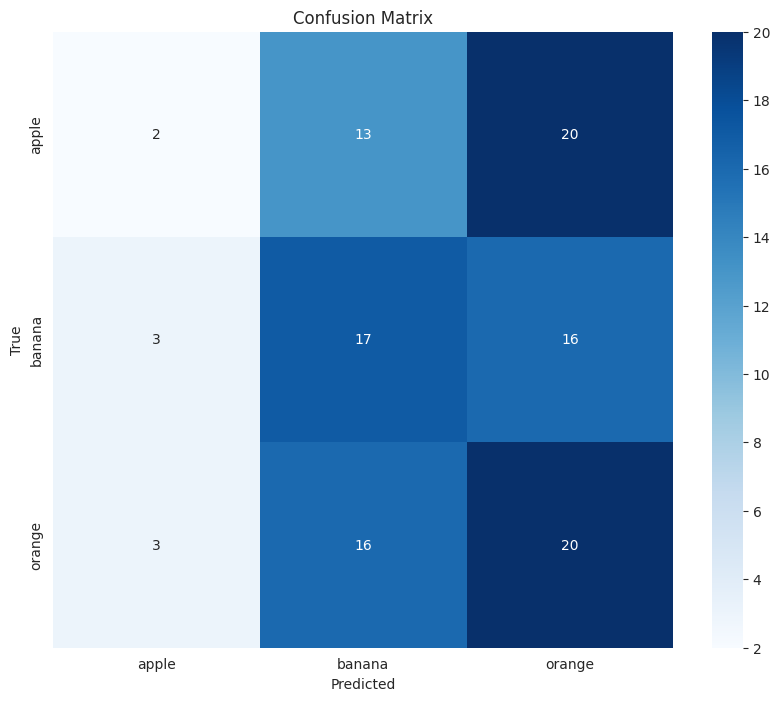

In [ ]:
# Get unique classes present in true_labels
unique_classes = np.unique(true_labels)

# Filter class_dict to include only present classes
filtered_class_dict = {k: v for k, v in class_dict.items() if v in unique_classes}

# Classification report using filtered class names
print("\nClassification Report:")
print(classification_report(true_labels, pred_labels, target_names=list(filtered_class_dict.keys())))

# Confusion matrix with filtered classes
cm = confusion_matrix(true_labels, pred_labels, labels=unique_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=list(filtered_class_dict.keys()), yticklabels=list(filtered_class_dict.keys()), cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


Classification Report:
              precision    recall  f1-score   support

       apple       0.23      0.18      0.20        34
      banana       0.17      0.03      0.04        39
       mixed       0.00      0.00      0.00         0
      orange       0.31      0.21      0.25        39

    accuracy                           0.13       112
   macro avg       0.18      0.10      0.12       112
weighted avg       0.24      0.13      0.16       112



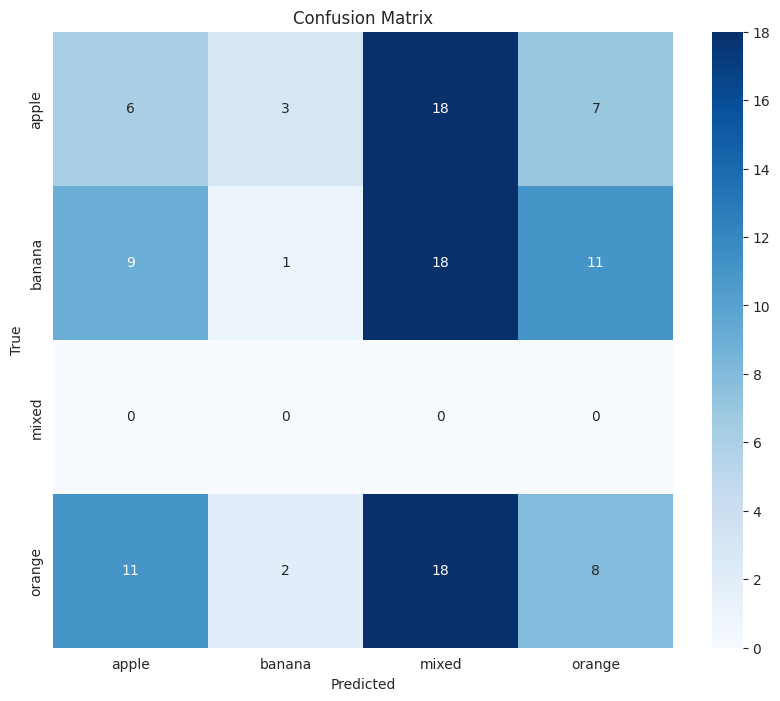

In [ ]:
# Classification report
print("\nClassification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_dict.keys()))

# Confusion matrix
cm = confusion_matrix(true_labels, pred_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_dict.keys(), yticklabels=class_dict.keys(), cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
✔️ Prediction 0: Class 3 with confidence 0.84 -> Box: 0.67, 0.58, 0.74, 0.92
✔️ Prediction 1: Class 0 with confidence 0.97 -> Box: 0.46, 0.56, 0.50, 0.50
✔️ Prediction 2: Class 1 with confidence 0.79 -> Box: 0.57, 0.68, 0.66, 0.59
✔️ Prediction 3: Class 0 with confidence 0.80 -> Box: 0.68, 0.74, 0.47, 0.66
✔️ Prediction 4: Class 1 with confidence 0.79 -> Box: 0.52, 0.48, 0.17, 0.79
❌ Prediction 5: Confidence 0.41 below threshold
❌ Prediction 6: Confidence 0.50 below threshold
❌ Prediction 7: Confidence 0.52 below threshold
❌ Prediction 8: Confidence 0.48 below threshold
❌ Prediction 9: Confidence 0.57 below threshold

✅ Final NMS-filtered predictions:
Class: 3, Confidence: 0.84, Box: x=0.67, y=0.58, w=0.74, h=0.92
Class: 0, Confidence: 0.97, Box: x=0.46, y=0.56, w=0.50, h=0.50
Class: 0, Confidence: 0.80, Box: x=0.68, y=0.74, w=0.47, h=0.66
Class: 1, Confidence: 0.79, Box: x=0.52, y=0.48, w=0.17, h=0.79
Class: 1, Confidence: 0.79, Box: x=0.57, y=0.6

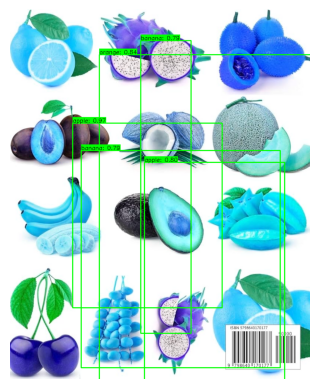

In [ ]:
def preprocess_image(image, target_size=(112, 112)):
    image_resized = cv2.resize(image, target_size)
    image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
    image_normalized = image_rgb / 255.0
    return np.expand_dims(image_normalized, axis=0)

def predict_image(image_path, threshold=0.7):
    image = cv2.imread(image_path)
    input_tensor = preprocess_image(image)
    predictions = model.predict(input_tensor)  # Shape: (1, 10, 8)
    predictions = predictions[0]  # Shape: (10, 8)

    boxes = []

    for i, pred in enumerate(predictions):
        x, y, w, h = pred[:4]
        logits = pred[4:]

        probs = tf.nn.softmax(logits).numpy()
        class_id = int(np.argmax(probs))
        confidence = float(np.max(probs))

        if confidence >= threshold:
            boxes.append(((x, y, w, h), class_id, confidence))
            print(f"✔️ Prediction {i}: Class {class_id} with confidence {confidence:.2f} -> Box: {x:.2f}, {y:.2f}, {w:.2f}, {h:.2f}")
        else:
            print(f"❌ Prediction {i}: Confidence {confidence:.2f} below threshold")

    return image, boxes

def apply_classwise_nms(predictions, image_shape, iou_threshold=0.4, max_output_size=3):
    classwise_boxes = {}
    h, w = image_shape[:2]

    for bbox, class_id, confidence in predictions:
        classwise_boxes.setdefault(class_id, []).append((bbox, confidence))

    final_predictions = []
    for class_id, boxes in classwise_boxes.items():
        if not boxes:
            continue
        boxes_np = np.array([b[0] for b in boxes])
        scores_np = np.array([b[1] for b in boxes])

        boxes_abs = []
        for (x_center, y_center, bw, bh) in boxes_np:
            x_center *= w
            y_center *= h
            bw *= w
            bh *= h
            x1 = x_center - bw / 2
            y1 = y_center - bh / 2
            x2 = x_center + bw / 2
            y2 = y_center + bh / 2
            boxes_abs.append([y1, x1, y2, x2])

        selected_indices = tf.image.non_max_suppression(
            boxes=boxes_abs,
            scores=scores_np,
            max_output_size=max_output_size,
            iou_threshold=iou_threshold
        )

        for i in selected_indices.numpy():
            final_predictions.append((boxes_np[i], class_id, scores_np[i]))

    return final_predictions

def draw_predictions(image, predictions, class_dict):
    h, w = image.shape[:2]
    class_names = {v: k for k, v in class_dict.items()}

    for bbox, class_id, confidence in predictions:
        label = f"{class_names[class_id]}: {confidence:.2f}"
        x_center, y_center, bw, bh = bbox
        x_center *= w
        y_center *= h
        bw *= w
        bh *= h

        x1 = int(x_center - bw / 2)
        y1 = int(y_center - bh / 2)
        x2 = int(x_center + bw / 2)
        y2 = int(y_center + bh / 2)

        color = (0, 255, 0)
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)

        (text_w, text_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(image, (x1, y1 - text_h - 4), (x1 + text_w, y1), color, -1)
        cv2.putText(image, label, (x1, y1 - 2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

    return image

image_path = "fruits.jpg"
image = cv2.imread(image_path)
original_image, raw_boxes = predict_image(image, threshold=0.7)
final_boxes = apply_classwise_nms(raw_boxes, original_image.shape)

print("\n✅ Final NMS-filtered predictions:")
for (x, y, w, h), class_id, conf in final_boxes:
    print(f"Class {class_id} with confidence {conf:.2f} -> Box: {x:.2f}, {y:.2f}, {w:.2f}, {h:.2f}")

image_with_boxes = draw_predictions(original_image.copy(), final_boxes, CLASS_DICT)

plt.imshow(image_with_boxes)
plt.axis('off')
plt.show()

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 64.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(data="/content/Fruits-by-YOLO-1/data.yaml", epochs=20) # remove path from data.yaml
# results = model.train(data="/content/data.yaml", epochs=20)

Ultralytics 8.3.125 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Fruits-by-YOLO-1/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

train: Scanning /content/Fruits-by-YOLO-1/train/labels... 2697 images, 6 backgrounds, 579 corrupt: 100%|██████████| 2697/2697 [00:04<00:00, 674.13it/s]

train: /content/Fruits-by-YOLO-1/train/images/Image_100_jpg.rf.63d8f5989a117bdfcab7ffc88666bbb9.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0902      1.0217]
train: /content/Fruits-by-YOLO-1/train/images/Image_100_jpg.rf.9cb30dc0ec1cb1493641403b6c0cb936.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0163]
train: /content/Fruits-by-YOLO-1/train/images/Image_10_jpg.rf.41b514113368a05ebebcd8bee8eebb3b.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0442       1.038]
train: /content/Fruits-by-YOLO-1/train/images/Image_10_jpg.rf.722f9a8c9837871b14e8ee802cee966f.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0451      1.0451]
train: /content/Fruits-by-YOLO-1/train/images/Image_11_jpg.rf.8315e682749993f4f949f35e82531d96.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.4098      1.3303]
train: /co

train: New cache created: /content/Fruits-by-YOLO-1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 71.6±120.6 MB/s, size: 44.8 KB)


val: Scanning /content/Fruits-by-YOLO-1/valid/labels... 187 images, 1 backgrounds, 39 corrupt: 100%|██████████| 187/187 [00:00<00:00, 454.70it/s]

val: /content/Fruits-by-YOLO-1/valid/images/Image_17_jpg.rf.ec66c4cd8c4cc0f066cebed712cdf239.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1213]
val: /content/Fruits-by-YOLO-1/valid/images/Image_23_png.rf.009e5303445e3ae64be2d1eee31c0aff.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [       1.01]
val: /content/Fruits-by-YOLO-1/valid/images/Image_25_jpg.rf.026ff8d6042a2375319212252d13fec3.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1107      1.0991]
val: /content/Fruits-by-YOLO-1/valid/images/Image_32_jpg.rf.54cfddbdfe6885ab87974a3d102ae393.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1367]
val: /content/Fruits-by-YOLO-1/valid/images/Image_32_jpg.rf.a154f76303a336cf8763c5b3a1f4cc65.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0354]
val: /content/Fruits-by-YOLO-1/valid/images/Image_35_jpg.r

val: New cache created: /content/Fruits-by-YOLO-1/valid/labels.cache
Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train6
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.35G      1.372      3.264      1.666         43        640: 100%|██████████| 133/133 [00:50<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.05it/s]

                   all        148        341      0.334      0.316      0.318      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.74G      1.455      2.292        1.7         25        640: 100%|██████████| 133/133 [00:47<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]


                   all        148        341      0.579      0.464      0.495       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.76G       1.44      2.068      1.681         22        640: 100%|██████████| 133/133 [00:44<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]


                   all        148        341       0.52      0.496      0.481      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.78G      1.418      1.942      1.655         28        640: 100%|██████████| 133/133 [00:47<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]


                   all        148        341      0.467      0.589      0.497       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.79G      1.396      1.839      1.642         41        640: 100%|██████████| 133/133 [00:44<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.30it/s]

                   all        148        341      0.575      0.683      0.661      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       2.8G      1.366      1.721      1.612         41        640: 100%|██████████| 133/133 [00:44<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]


                   all        148        341      0.585      0.743      0.692      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.82G      1.346      1.624      1.592         30        640: 100%|██████████| 133/133 [00:46<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]

                   all        148        341      0.658      0.683      0.716      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.83G      1.323      1.569      1.583         46        640: 100%|██████████| 133/133 [00:44<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.76it/s]

                   all        148        341      0.608      0.722       0.68      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.85G      1.322      1.516      1.573         17        640: 100%|██████████| 133/133 [00:45<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.51it/s]


                   all        148        341      0.643      0.581      0.646      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.86G      1.306      1.472      1.561         33        640: 100%|██████████| 133/133 [00:44<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]


                   all        148        341      0.615      0.699      0.662      0.397
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.88G       1.13      1.367       1.57         15        640: 100%|██████████| 133/133 [00:41<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.41it/s]

                   all        148        341      0.648      0.754      0.729      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.89G      1.103      1.221      1.534         15        640: 100%|██████████| 133/133 [00:39<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]


                   all        148        341      0.643      0.763      0.729      0.475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.91G      1.066      1.127      1.504         15        640: 100%|██████████| 133/133 [00:40<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.82it/s]


                   all        148        341      0.664       0.76      0.736      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.92G      1.046      1.067      1.491         14        640: 100%|██████████| 133/133 [00:40<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.83it/s]

                   all        148        341      0.701      0.815      0.743      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.94G      1.013     0.9936      1.462          9        640: 100%|██████████| 133/133 [00:39<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.86it/s]


                   all        148        341      0.714      0.704      0.737      0.475

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.95G     0.9936     0.9519      1.448         28        640: 100%|██████████| 133/133 [00:39<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]


                   all        148        341      0.691      0.778      0.752      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.97G     0.9694     0.8941      1.424         18        640: 100%|██████████| 133/133 [00:40<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.87it/s]

                   all        148        341      0.661      0.807      0.769      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.98G      0.947      0.853      1.406         15        640: 100%|██████████| 133/133 [00:39<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.34it/s]

                   all        148        341      0.786      0.704      0.757      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         3G     0.9248     0.8015      1.376         19        640: 100%|██████████| 133/133 [00:40<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.93it/s]


                   all        148        341      0.714      0.806      0.755      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.01G     0.9089     0.7927      1.371         12        640: 100%|██████████| 133/133 [00:39<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.13it/s]


                   all        148        341      0.776      0.724      0.766      0.521

20 epochs completed in 0.251 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 5.5MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics 8.3.125 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,907 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]


                   all        148        341      0.661      0.808       0.77      0.523
                 Apple         15         19      0.797          1      0.947      0.596
                Banana         14         47      0.716      0.681      0.668      0.369
                Grapes         16         29      0.552      0.552       0.54      0.322
                  Kiwi         16         45      0.724      0.817       0.84      0.638
                 Mango         12         26      0.375      0.577       0.52      0.357
                Orange         22         63      0.799      0.889      0.861      0.591
             Pineapple         29         56      0.652      0.839      0.768      0.481
            Sugerapple          4          6      0.662          1      0.898      0.692
            Watermelon         19         50      0.671       0.92      0.886      0.659
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms loss, 8.1ms postprocess per image
Results saved to runs/detect

### Display yolo stats

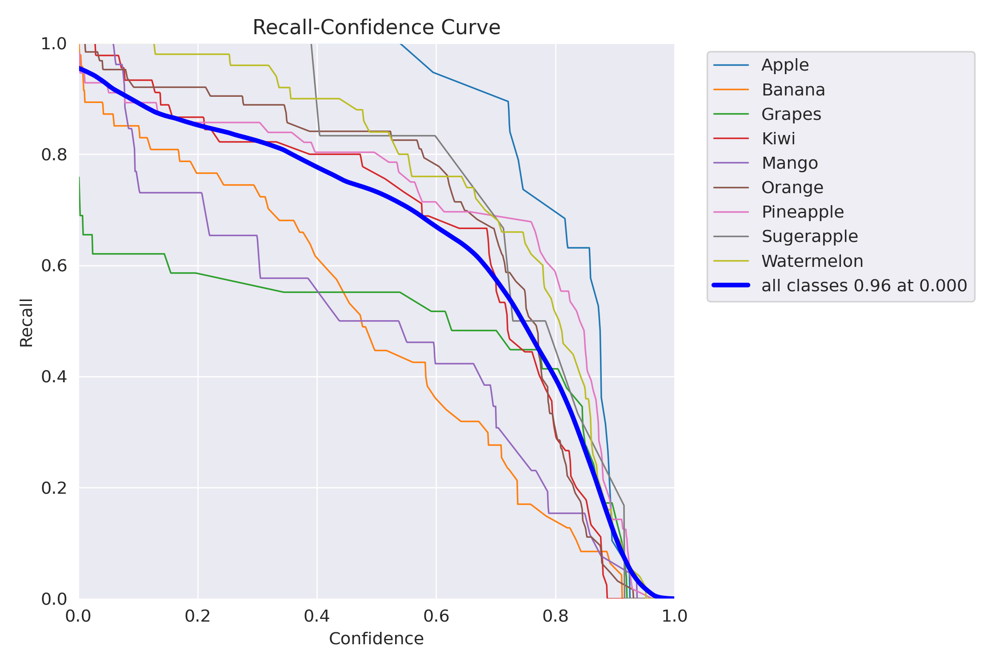

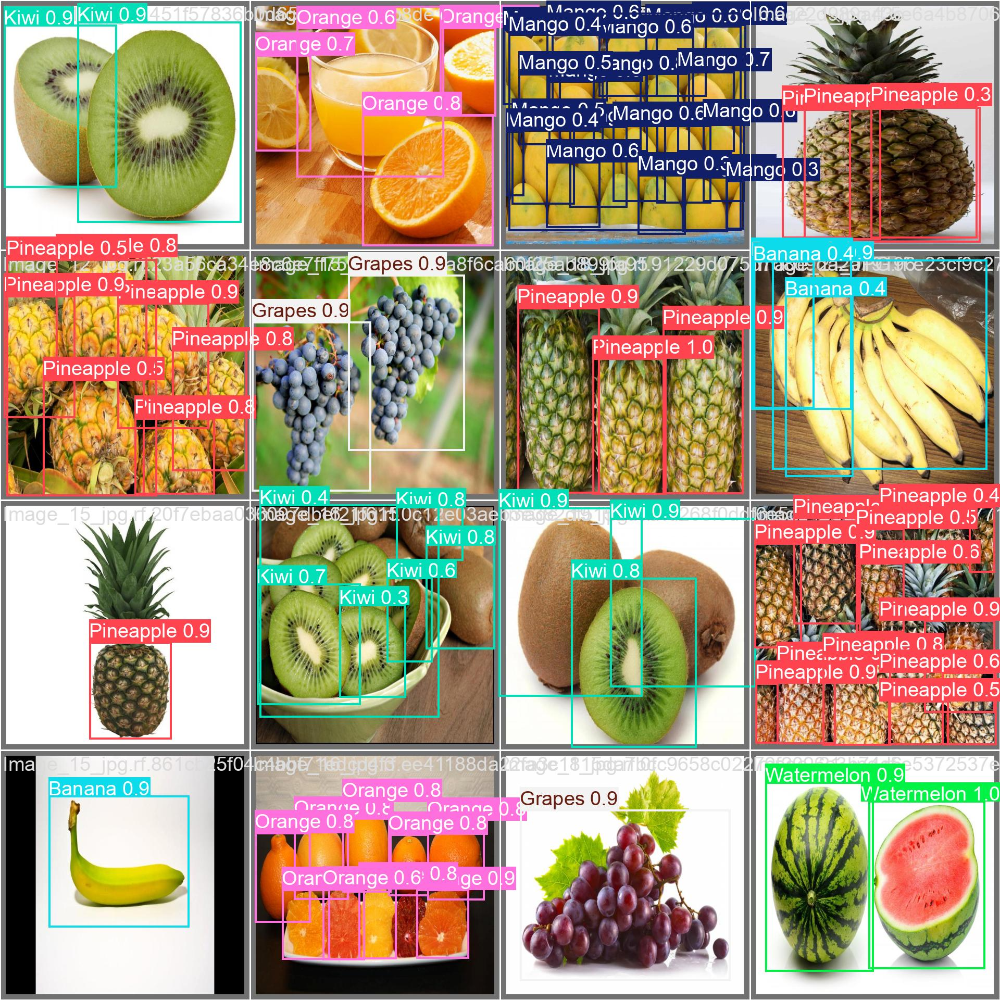

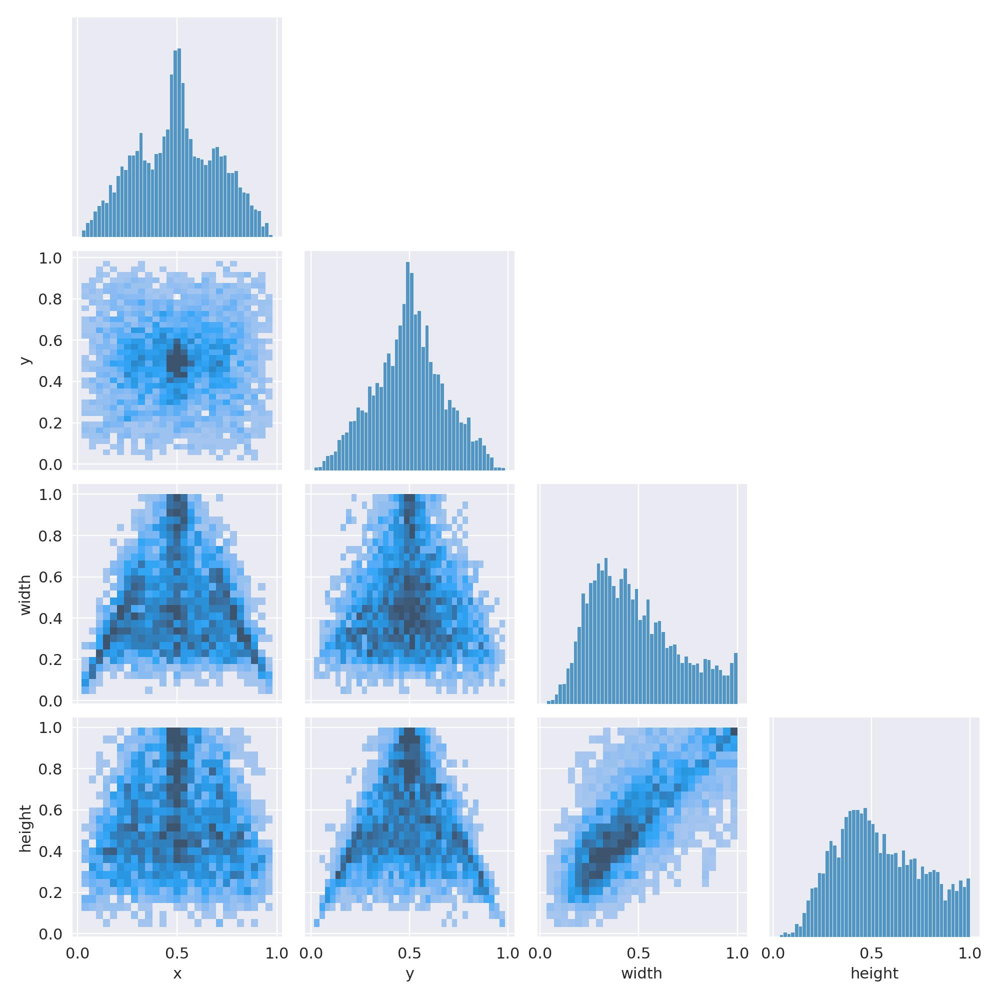

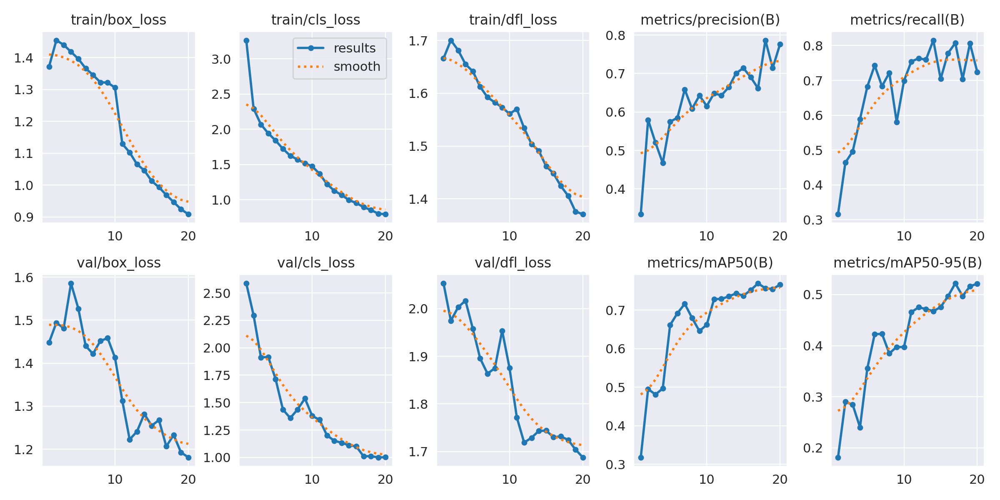

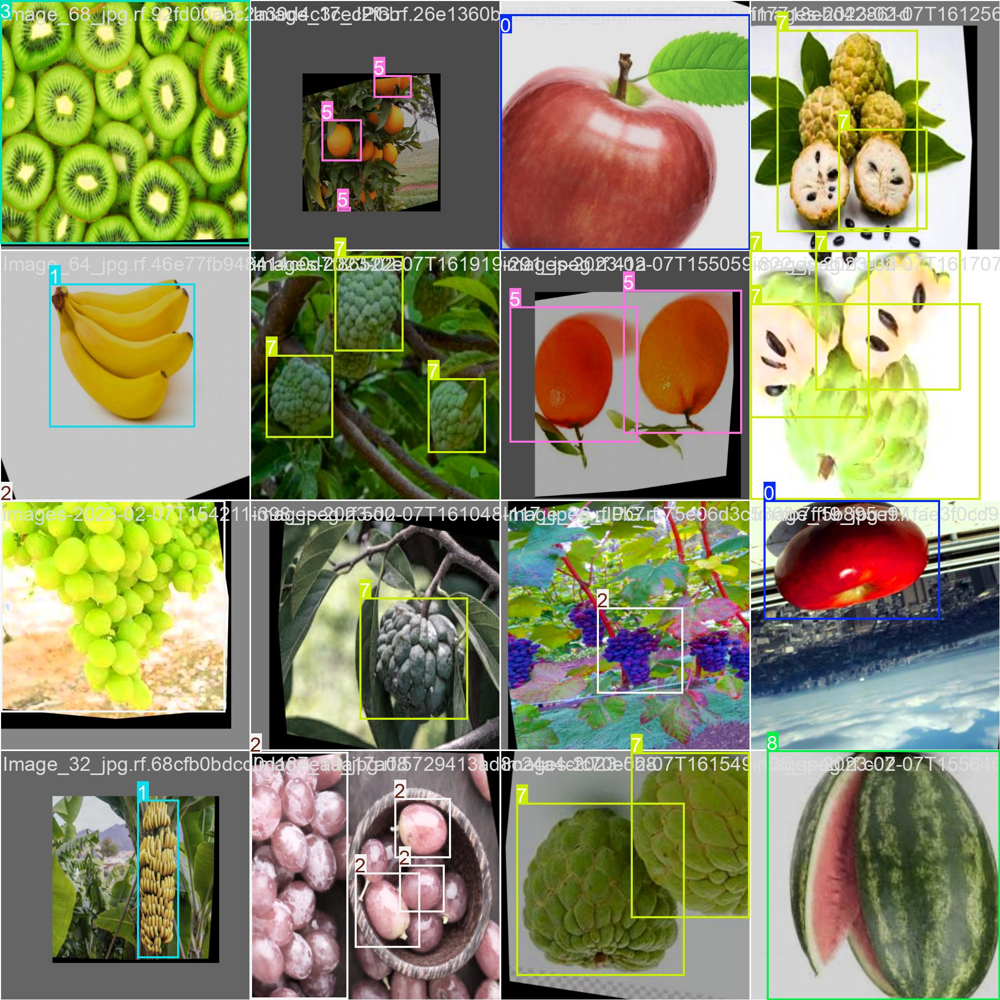

...

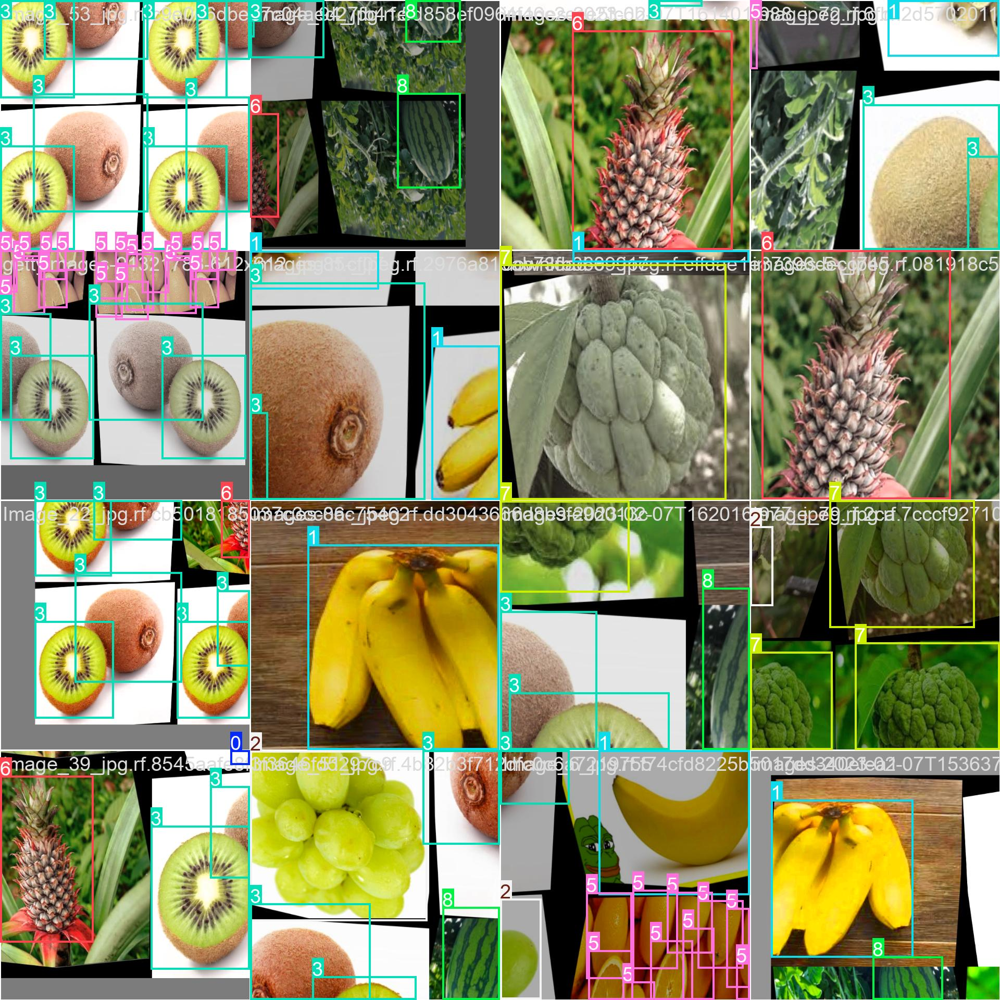

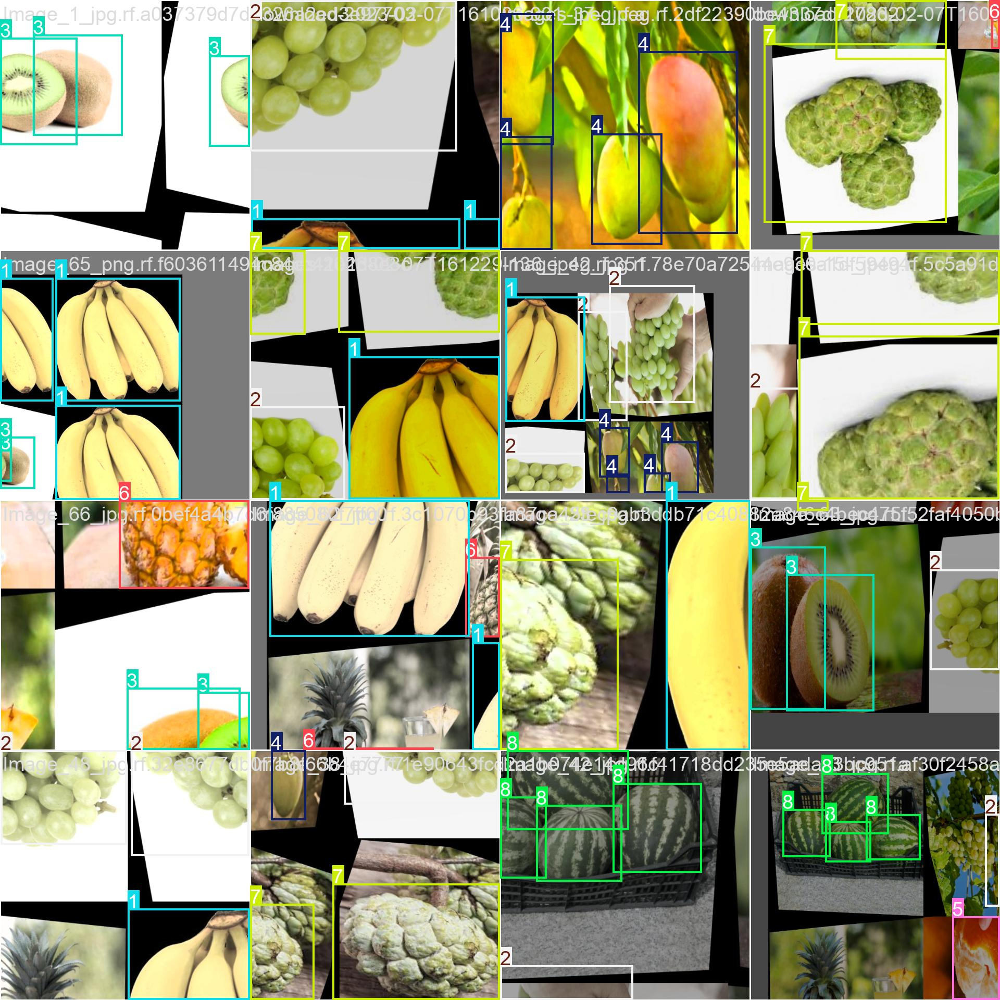

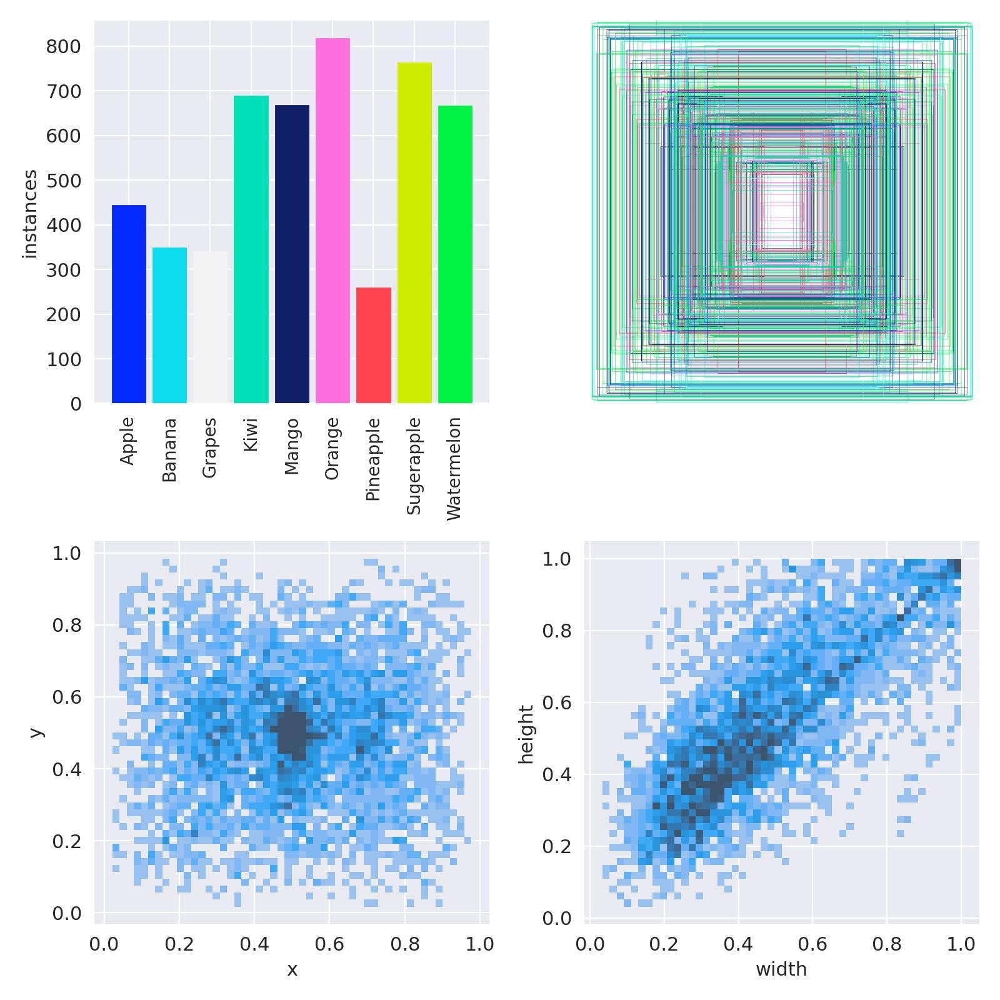

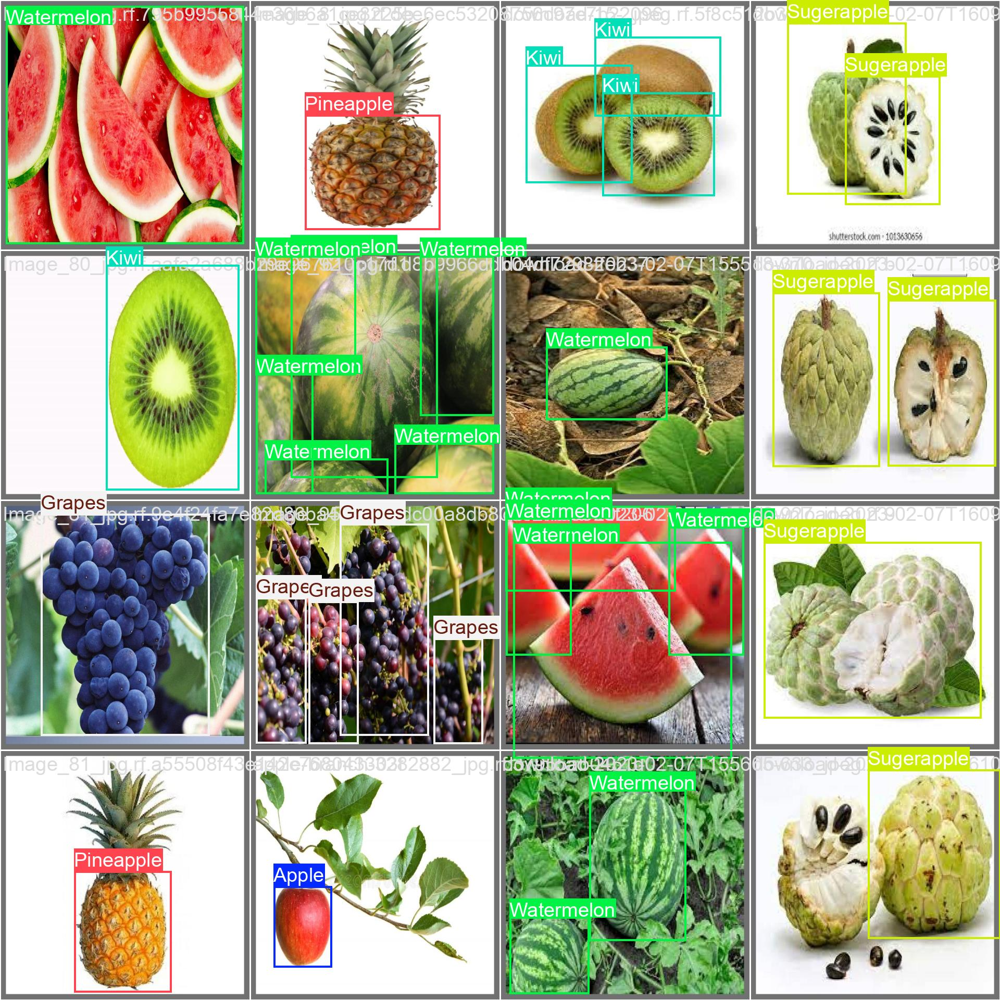

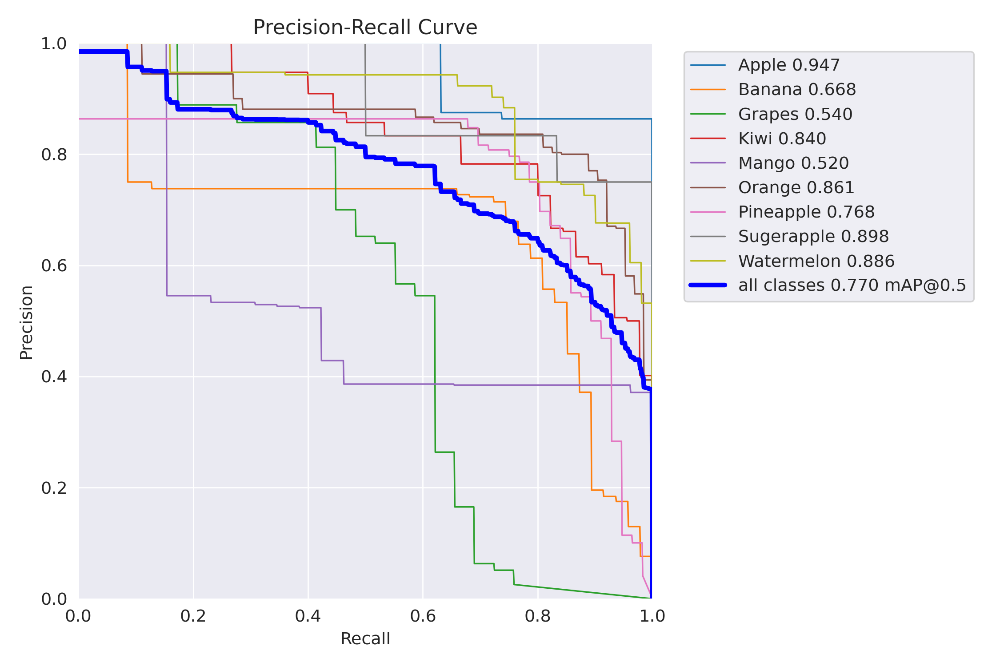

In [ ]:
from IPython.display import Image, display

path='/content/runs/detect/train6'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
    display(Image(filename=path+'/'+image[i]))


image 1/1 /content/test/images/orange_90.jpg: 512x640 9 Oranges, 86.3ms
Speed: 3.3ms preprocess, 86.3ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)


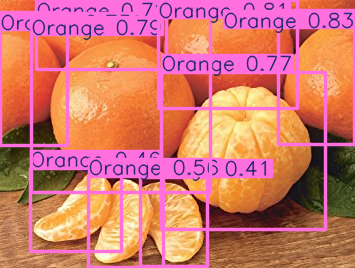

In [ ]:
model = YOLO("/content/runs/detect/train6/weights/best.pt")

results = model.predict("/content/test/images/orange_90.jpg")

results[0].show()


image 1/1 /content/banana.webp: 448x640 3 Bananas, 73.4ms
Speed: 2.8ms preprocess, 73.4ms inference, 3.3ms postprocess per image at shape (1, 3, 448, 640)


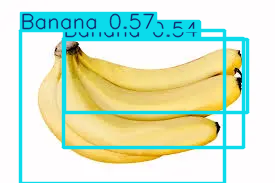

In [ ]:
results = model.predict("/content/banana.webp")

results[0].show()

### Run in case of drawing one box

In [ ]:
def preprocess_image(image):
    image = cv2.resize(image, IMG_SIZE)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.GaussianBlur(image, (3, 3), 0) # Noise reduction
    image = cv2.equalizeHist(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY))
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    # clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))  # Contrast enhancement
    # enhanced = clahe.apply(blurred)

    # filtered = cv2.bilateralFilter(enhanced, 9, 75, 75) # Edge-preserving smoothing
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb) # filter
    return image

def parse_annotation(image_path, xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    image = cv2.imread(image_path)
    h_org, w_org = image.shape[:2]
    image = preprocess_image(image)

    obj = root.find('object')
    bbox = obj.find('bndbox')

    xmin = int(bbox.find('xmin').text)
    ymin = int(bbox.find('ymin').text)
    xmax = int(bbox.find('xmax').text)
    ymax = int(bbox.find('ymax').text)

    x_center = (xmin + xmax) / 2 / w_org
    y_center = (ymin + ymax) / 2 / h_org
    box_width = (xmax - xmin) / w_org
    box_height = (ymax - ymin) / h_org

    class_name = obj.find('name').text
    class_id = CLASS_DICT.get(class_name, -1)

    if class_id == -1:
        return None

    return image, [x_center, y_center, box_width, box_height], class_id

def load_data(dataset_dir):
    images = []
    boxes = []
    class_ids = []

    for file in os.listdir(dataset_dir):
        if file.endswith(".jpg"):
            img_path = os.path.join(dataset_dir, file)
            xml_path = os.path.join(dataset_dir, file.replace(".jpg", ".xml"))
            if os.path.exists(xml_path):
                result = parse_annotation(img_path, xml_path)
                if result:
                    img, box, class_id = result
                    images.append(img)
                    boxes.append(box)
                    class_ids.append(class_id)
    return np.array(images), np.array(boxes), np.array(class_ids)

images, boxes, class_ids = load_data(TRAIN_PATH)
images_test, boxes_test, class_ids_test = load_data(TEST_PATH)

# Normalize images
images = images.astype("float32") / 255.0
images_test = images_test.astype("float32") / 255.0

# One-hot encode class labels
class_ids_onehot = tf.keras.utils.to_categorical(class_ids, num_classes=NUM_CLASSES)
class_ids_test_onehot = tf.keras.utils.to_categorical(class_ids_test, num_classes=NUM_CLASSES)

# Split
X_train, X_val, y_box_train, y_box_val, y_cls_train, y_cls_val = train_test_split(
    images, boxes, class_ids_onehot, test_size=0.2, random_state=42
)

### Only predict one box

In [ ]:
model = Sequential([
    Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=(256, 256, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation="relu", padding="same"),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation="relu", padding="same"),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation="relu"),
    Dense(64, activation="relu"),
    Dense(4, activation="sigmoid")  # x_center, y_center, width, height
])

model.compile(optimizer=Adam(learning_rate=0.001), loss="mse", metrics=["acc", "mae"])
model.summary()

history = model.fit(
    X_train,
    y_box_train,
    validation_data=(X_val, y_box_val),
    epochs=20,
    batch_size=16,
    shuffle=True
)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    16,777,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,879,108 (64.39 MB)

 Trainable params: 16,879,108 (64.39 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - acc: 0.2999 - loss: 0.0670 - mae: 0.2032 - val_acc: 0.5833 - val_loss: 0.0210 - val_mae: 0.1115
Epoch 2/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - acc: 0.3844 - loss: 0.0269 - mae: 0.1300 - val_acc: 0.5833 - val_loss: 0.0223 - val_mae: 0.1172
Epoch 3/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - acc: 0.4274 - loss: 0.0226 - mae: 0.1191 - val_acc: 0.3125 - val_loss: 0.0239 - val_mae: 0.1162
Epoch 4/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - acc: 0.6102 - loss: 0.0140 - mae: 0.0933 - val_acc: 0.5625 - val_loss: 0.0211 - val_mae: 0.1125
Epoch 5/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - acc: 0.6808 - loss: 0.0084 - mae: 0.0729 - val_acc: 0.4792 - val_loss: 0.0234 - val_mae: 0.1141
Epoch 6/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - acc: 0.7878 - loss: 0.0056 - mae: 0.0577 - val_acc: 0.5208 - val_loss: 0.0231 - val_mae: 0.1157
Epoch 7/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - acc: 0.8282 - loss: 0.0034 - mae: 0.0443 - val_acc:

In [ ]:
model.save("fruit_detection_bbox.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


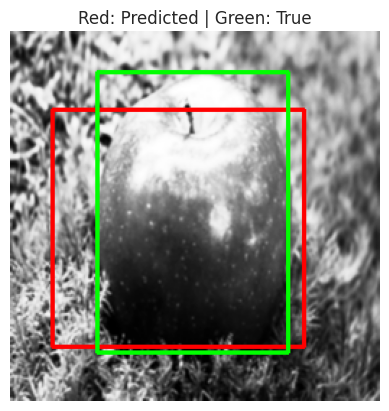

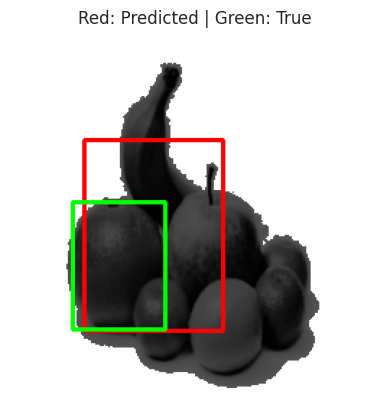

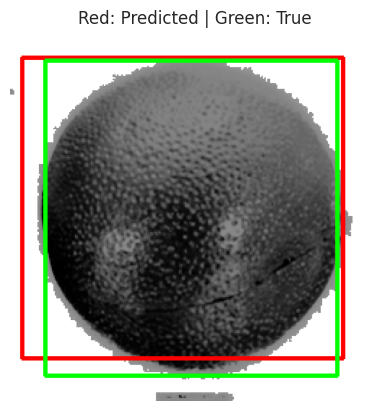

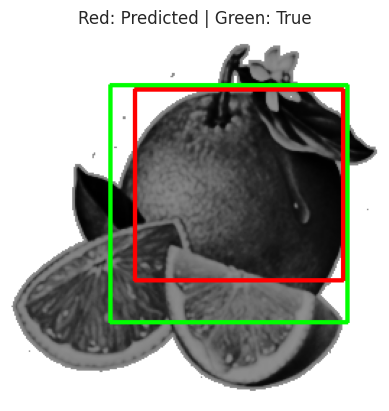

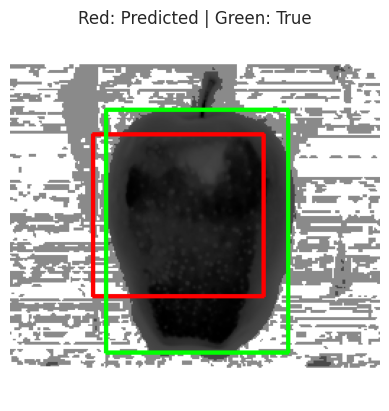

In [ ]:
def visualize_predictions(model, images, true_boxes, num=5):
    preds = model.predict(images[:num])
    for i in range(num):
        img = images[i].copy()
        pred_box = preds[i]
        true_box = true_boxes[i]
        h, w = img.shape[:2]

        # Denormalize coordinates
        px, py, pw, ph = pred_box
        px, py, pw, ph = int(px * w), int(py * h), int(pw * w), int(ph * h)
        tx, ty, tw, th = true_box
        tx, ty, tw, th = int(tx * w), int(ty * h), int(tw * w), int(th * h)

        # Convert to rectangle coordinates
        pred_start = (px - pw // 2, py - ph // 2)
        pred_end = (px + pw // 2, py + ph // 2)
        true_start = (tx - tw // 2, ty - th // 2)
        true_end = (tx + tw // 2, ty + th // 2)

        img = (img * 255).astype(np.uint8)

        # Draw predicted box in red, ground truth in green
        img = cv2.rectangle(img, pred_start, pred_end, (0, 0, 255), 2)
        img = cv2.rectangle(img, true_start, true_end, (0, 255, 0), 2)

        # class_name_pred = list(CLASS_DICT.keys())[pred_classes[i]]
        # class_name_true = list(CLASS_DICT.keys())[true_classes[i]]

        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Red: Predicted | Green: True")
        # plt.title(f"Pred: {class_name_pred} | True: {class_name_true}")
        plt.axis("off")
        plt.show()

### Val
# visualize_predictions(model, X_val, y_box_val, num=5)

### Test
visualize_predictions(model, images_test, boxes_test, num=5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


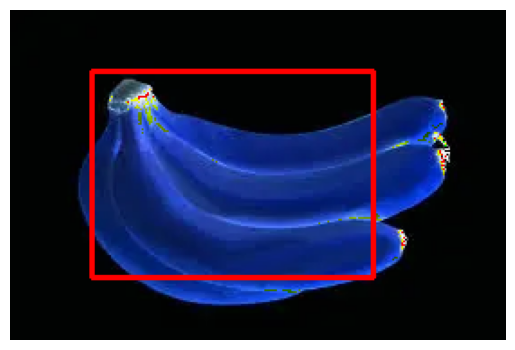

In [ ]:
image = cv2.imread("banana.webp")
image_resized = cv2.resize(image, (256, 256))
image_resized = image_resized / 255.0  # Normalize pixel values to [0, 1]
image_resized = np.expand_dims(image_resized, axis=0)  # Add batch dimension
preds = model.predict(image_resized)
h, w = image.shape[:2]

# Denormalize coordinates
px, py, pw, ph = preds[0]
px, py, pw, ph = int(px * w), int(py * h), int(pw * w), int(ph * h)

# Convert to rectangle coordinates
pred_start = (px - pw // 2, py - ph // 2)
pred_end = (px + pw // 2, py + ph // 2)

img = (image * 255).astype(np.uint8)

img = cv2.rectangle(img, pred_start, pred_end, (0, 0, 255), 2)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

### Predict one box and label

In [ ]:
input_layer = Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3))

x = Conv2D(32, (3, 3), activation="relu", padding="same")(input_layer)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
x = Dense(256, activation="relu")(x)

# Bounding box head
bbox_output = Dense(4, activation="sigmoid", name="bbox")(x)

# Classification head
class_output = Dense(NUM_CLASSES, activation="softmax", name="class")(x)

model = Model(inputs=input_layer, outputs=[bbox_output, class_output])
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss={"bbox": "mse", "class": "categorical_crossentropy"},
    metrics={"bbox": ["mae"], "class": ["accuracy"]}
)

model.summary()

history = model.fit(
    X_train,
    {"bbox": y_box_train, "class": y_cls_train},
    validation_data=(X_val, {"bbox": y_box_val, "class": y_cls_val}),
    epochs=20,
    batch_size=16
)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │        896 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │      9,248 │ max_pooling2d_3[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ conv2d_4[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │     18,496 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │     73,856 │ max_pooling2d_5[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 16, 16,    │          0 │ conv2d_6[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 32768)     │          0 │ max_pooling2d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 256)       │  8,388,864 │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bbox (Dense)        │ (None, 4)         │      1,028 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ class (Dense)       │ (None, 4)         │      1,028 │ dense_3[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 8,493,416 (32.40 MB)

 Trainable params: 8,493,416 (32.40 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - bbox_loss: 0.0336 - bbox_mae: 0.1466 - class_accuracy: 0.3793 - class_loss: 1.3633 - loss: 1.3969 - val_bbox_loss: 0.0216 - val_bbox_mae: 0.1147 - val_class_accuracy: 0.3750 - val_class_loss: 1.0628 - val_loss: 1.0844
Epoch 2/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - bbox_loss: 0.0273 - bbox_mae: 0.1309 - class_accuracy: 0.4275 - class_loss: 1.0756 - loss: 1.1029 - val_bbox_loss: 0.0210 - val_bbox_mae: 0.1125 - val_class_accuracy: 0.4583 - val_class_loss: 1.0313 - val_loss: 1.0523
Epoch 3/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - bbox_loss: 0.0285 - bbox_mae: 0.1339 - class_accuracy: 0.5760 - class_loss: 0.8965 - loss: 0.9249 - val_bbox_loss: 0.0226 - val_bbox_mae: 0.1143 - val_class_accuracy: 0.5417 - val_class_loss: 0.9599 - val_loss: 0.9825
Epoch 4/20
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - bbox_loss: 0.0258 - bbox_mae: 0.1301 - class_accuracy: 0.6974 - class_loss: 0.7026 - loss: 0.7283 - val_bbox_loss: 0.0251 - val_bbox_

In [ ]:
model.save("fruit_detection_bbox_label.h5")

In [ ]:
pred_box, pred_class_probs = model.predict(images_test)
pred_class = np.argmax(pred_class_probs, axis=1)
true_classes = np.argmax(class_ids_test_onehot, axis=1)

unique_classes = np.unique(class_ids_test)
target_names = [k for k, v in CLASS_DICT.items() if v in unique_classes]
print(classification_report(true_classes, pred_class, target_names=target_names))

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step
              precision    recall  f1-score   support

       apple       0.55      0.60      0.57        20
      banana       0.69      0.58      0.63        19
      orange       0.50      0.52      0.51        21

    accuracy                           0.57        60
   macro avg       0.58      0.57      0.57        60
weighted avg       0.57      0.57      0.57        60



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


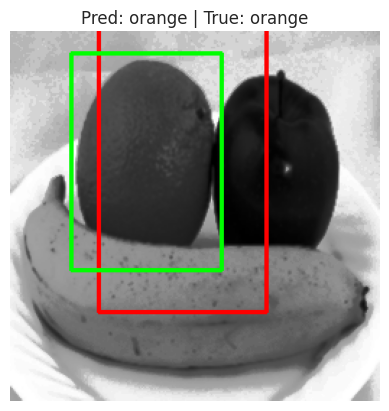

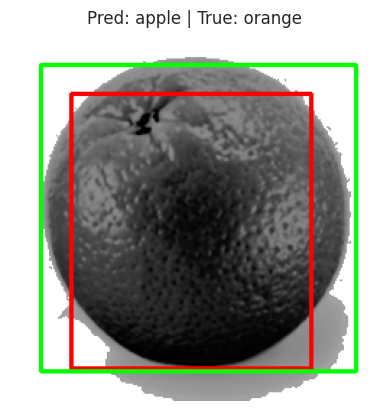

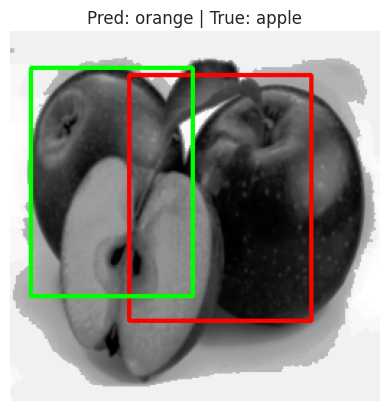

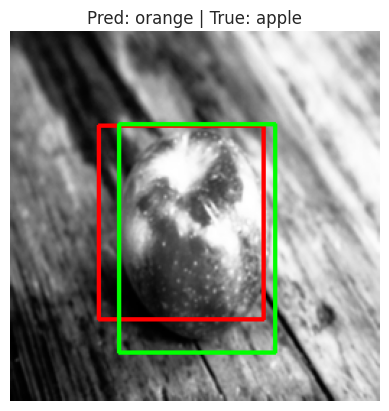

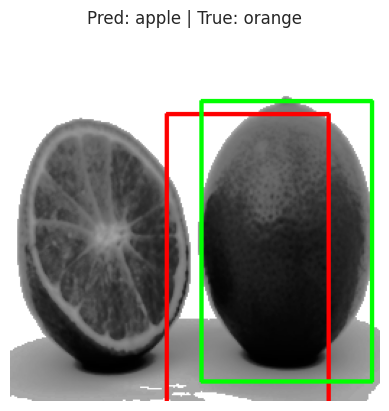

In [ ]:
def visualize_predictions(model, images, true_boxes, true_classes_onehot, num=5):
    pred_boxes, pred_class_probs = model.predict(images[:num])
    pred_classes = np.argmax(pred_class_probs, axis=1)
    true_classes = np.argmax(true_classes_onehot[:num], axis=1)

    for i in range(num):
        img = images[i].copy()
        pred_box = pred_boxes[i]
        true_box = true_boxes[i]
        h, w = img.shape[:2]

        px, py, pw, ph = int(pred_box[0] * w), int(pred_box[1] * h), int(pred_box[2] * w), int(pred_box[3] * h)
        tx, ty, tw, th = int(true_box[0] * w), int(true_box[1] * h), int(true_box[2] * w), int(true_box[3] * h)

        pred_start = (px - pw // 2, py - ph // 2)
        pred_end = (px + pw // 2, py + ph // 2)
        true_start = (tx - tw // 2, ty - th // 2)
        true_end = (tx + tw // 2, ty + th // 2)

        img = (img * 255).astype(np.uint8)
        img = cv2.rectangle(img, pred_start, pred_end, (0, 0, 255), 2)
        img = cv2.rectangle(img, true_start, true_end, (0, 255, 0), 2)

        pred_label = list(CLASS_DICT.keys())[pred_classes[i]]
        true_label = list(CLASS_DICT.keys())[true_classes[i]]

        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Pred: {pred_label} | True: {true_label}")
        plt.axis("off")
        plt.show()
visualize_predictions(model, X_val, y_box_val, y_cls_val, num=5)

### Run in case of classification whole image with a label

In [ ]:
images = []
labels = []
X_test = []
y_test = []

for filename in os.listdir(TRAIN_PATH):
    if filename.split('.')[1] == 'jpg':
        img = cv2.imread(os.path.join(TRAIN_PATH,filename))

        labels.append(filename.split('_')[0])
        img = cv2.resize(img, IMG_SIZE)
        images.append(img)
        # images.append(os.path.join(TRAIN_PATH, filename))
print(labels)

for filename in os.listdir(TEST_PATH):
    if filename.split('.')[1] == 'jpg':
        img = cv2.imread(os.path.join(TEST_PATH, filename))

        y_test.append(filename.split('_')[0])
        img = cv2.resize(img, IMG_SIZE)
        X_test.append(img)
        # X_test.append(os.path.join(TEST_PATH, filename))
print(y_test)

train_labels = pd.get_dummies(labels).values
y_test = pd.get_dummies(y_test).values

train_images = np.array(images)
X_test = np.array(X_test)

['banana', 'apple', 'orange', 'mixed', 'apple', 'banana', 'orange', 'apple', 'apple', 'apple', 'apple', 'apple', 'banana', 'apple', 'banana', 'orange', 'orange', 'orange', 'apple', 'banana', 'banana', 'mixed', 'banana', 'banana', 'mixed', 'apple', 'banana', 'apple', 'orange', 'apple', 'banana', 'apple', 'apple', 'banana', 'orange', 'mixed', 'orange', 'orange', 'apple', 'banana', 'orange', 'orange', 'banana', 'apple', 'apple', 'orange', 'apple', 'apple', 'orange', 'orange', 'banana', 'apple', 'banana', 'orange', 'apple', 'apple', 'orange', 'banana', 'apple', 'banana', 'orange', 'apple', 'apple', 'orange', 'apple', 'orange', 'orange', 'orange', 'mixed', 'orange', 'apple', 'apple', 'apple', 'orange', 'apple', 'orange', 'banana', 'orange', 'mixed', 'banana', 'orange', 'banana', 'orange', 'mixed', 'apple', 'orange', 'apple', 'banana', 'orange', 'banana', 'banana', 'apple', 'orange', 'apple', 'banana', 'orange', 'mixed', 'orange', 'mixed', 'banana', 'apple', 'banana', 'banana', 'apple', 'ora

In [ ]:
label_train_unique = np.unique(np.array(labels))
label_test_unique = np.unique(np.array(y_test))

print("Sample of One Hot encoded label: ", train_labels[0])

print("\nUnique labels for train are: ", label_train_unique)
print("Number of jpg images in train are: ", len(train_images))

print("\nUnique labels are for test are: ", label_test_unique)
print("Number of jpg images for test are: ", len(X_test))

Sample of One Hot encoded label:  [False  True False False]

Unique labels for train are:  ['apple' 'banana' 'mixed' 'orange']
Number of jpg images in train are:  240

Unique labels are for test are:  [False  True]
Number of jpg images for test are:  60


In [ ]:
X_train, X_val, y_train, y_val = train_test_split(train_images, train_labels, random_state=1)

X_train = X_train.astype('float32') / 255
X_val = X_val.astype('float32') / 255
X_test = X_test.astype('float32') / 255

print("IMAGES: Train:", X_train.shape, "Val:", X_val.shape, "Test:", X_test.shape)
print("LABELS: Train:", y_train.shape, "Val:", y_val.shape, "Test:", y_test.shape)

IMAGES: Train: (180, 256, 256, 3) Val: (60, 256, 256, 3) Test: (60, 256, 256, 3)
LABELS: Train: (180, 4) Val: (60, 4) Test: (60, 4)


In [ ]:
model = Sequential([
    Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu", input_shape= IMG_SHAPE),
    Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"),
    Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(256,activation = "relu"),
    Dense(64,activation = "relu"),
    Dense(4, activation = "softmax")
])

model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │    33,554,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,858,404 (129.16 MB)

 Trainable params: 33,858,404 (129.16 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=15,
    batch_size=16,
    shuffle=False,
    validation_steps=None,
)

Epoch 1/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.3069 - loss: 1.4490 - val_accuracy: 0.5500 - val_loss: 1.2558
Epoch 2/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 90ms/step - accuracy: 0.6074 - loss: 1.1758 - val_accuracy: 0.7333 - val_loss: 0.8061
Epoch 3/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - accuracy: 0.6974 - loss: 0.7999 - val_accuracy: 0.8500 - val_loss: 0.5958
Epoch 4/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - accuracy: 0.7842 - loss: 0.6387 - val_accuracy: 0.9167 - val_loss: 0.4876
Epoch 5/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.8801 - loss: 0.4311 - val_accuracy: 0.9333 - val_loss: 0.4181
Epoch 6/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.8849 - loss: 0.3453 - val_accuracy: 0.9000 - val_loss: 0.6348
Epoch 7/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - accuracy: 0.9110 - loss: 0.3623 - val_accuracy: 0.9333 - val_loss: 0.3960
Epoch 8/15
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - accuracy: 0.9159 - loss: 0.2166 - val_accuracy: 0.8167 - va

In [ ]:
score, accuracy = model.evaluate(X_test, y_test)
print('Test score achieved: ', score)
print('Test accuracy achieved: ', accuracy)

2/2 ━━━━━━━━━━━━━━━━━━━━ 8s 4s/step - accuracy: 0.8910 - loss: 0.7400
Test score achieved:  0.9206925630569458
Test accuracy achieved:  0.8833333253860474


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


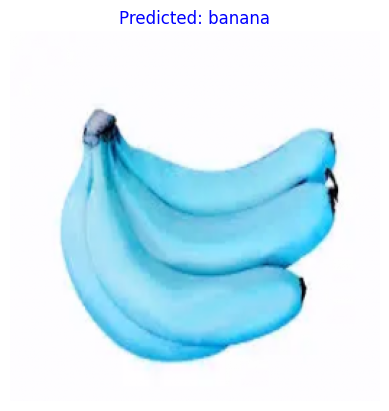

Predicted class index: 1
Confidence: 0.997282


In [ ]:
img = cv2.resize(cv2.imread("banana.webp"), IMG_SIZE) / 255.0
img_array = np.expand_dims(img, axis=0)

pred = model.predict(img_array)
class_index = np.argmax(pred)
confidence = np.max(pred)

class_labels = ['apple', 'banana', 'mixed', 'orange']
predicted_class = class_labels[class_index]
plt.imshow(img)
plt.title(f'Predicted: {predicted_class}', color='blue')
plt.axis('off')
plt.show()

print("Predicted class index:", class_index)
print("Confidence:", confidence)

In [ ]:
model.save("fruit_detection_classification.h5")

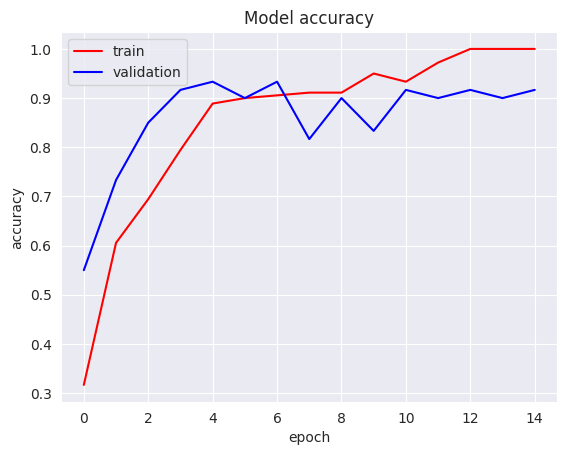

In [ ]:
plt.plot(history.history['accuracy'], label='train', color="red")
plt.plot(history.history['val_accuracy'], label='validation', color="blue")
plt.title('Model accuracy')
plt.legend(loc='upper left')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.show()